In [2]:
%matplotlib inline

import numpy as np
import pandas as pd

# Make inline plots vector graphics instead of raster graphics
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set() # sets seaborn default "prettyness:

import cartopy
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader

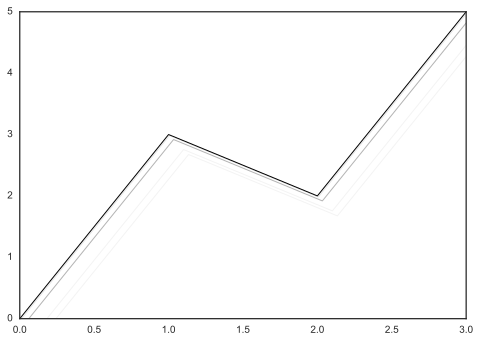

In [57]:
from matplotlib import patheffects

def drop_shadow(scale=1):
    return [patheffects.SimpleLineShadow(alpha=a, offset=(o,-o)) for a, o in [(0.3, scale*0.5), (0.1, 1), (0.05, scale*1.5), (0.05, scale*2)] ] + [patheffects.Normal()]



with sns.axes_style('white'):
    plt.plot([0, 3, 2, 5], linewidth=1, color='black', path_effects=drop_shadow(scale=10))



# Plot points on a map

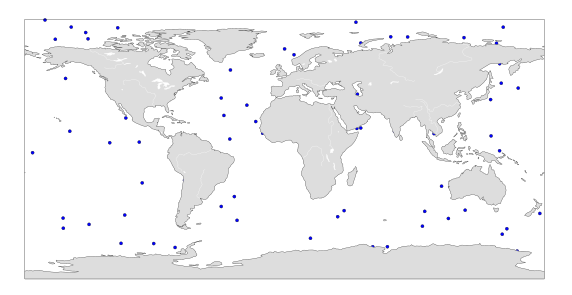

In [3]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.add_feature(cartopy.feature.LAND, facecolor='#DDDDDD')
ax.add_feature(cartopy.feature.RIVERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='white', linewidth=.25)

np.random.seed(1)
lon = 360 * np.random.rand(100)
lat = 180 * np.random.rand(100) - 90

ax.scatter(lon, lat, s=10, transform=ccrs.Geodetic())

ax.coastlines(color='#333333') ;

# Works for different projections

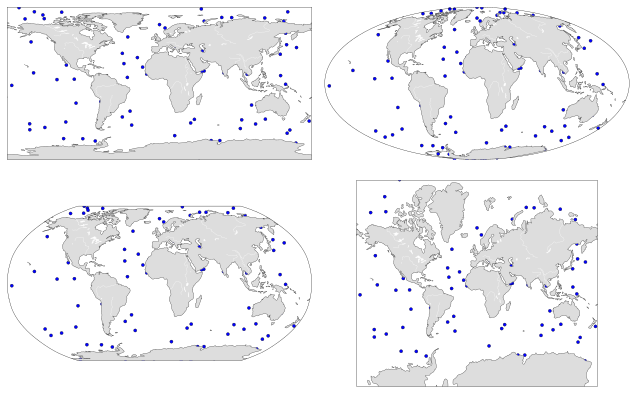

In [4]:
np.random.seed(1)
lon = 360 * np.random.rand(100)
lat = 180 * np.random.rand(100) - 90

fig = plt.figure(figsize=(9,6))

ax = fig.add_subplot(2, 2, 1, projection=ccrs.PlateCarree())
ax.add_feature(cartopy.feature.LAND, facecolor='#DDDDDD')
ax.add_feature(cartopy.feature.RIVERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='white', linewidth=.25)
ax.scatter(lon, lat, s=10, transform=ccrs.Geodetic())
# set visible part of the world (default is plotted part)
ax.set_global()
ax.coastlines(color='#333333') ;

ax = fig.add_subplot(2, 2, 2, projection=ccrs.Mollweide())
ax.add_feature(cartopy.feature.LAND, facecolor='#DDDDDD')
ax.add_feature(cartopy.feature.RIVERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='white', linewidth=.25)
ax.scatter(lon, lat, s=10, transform=ccrs.Geodetic())
ax.set_global()
ax.coastlines(color='#333333') ;

ax = fig.add_subplot(2, 2, 3, projection=ccrs.Robinson())
ax.add_feature(cartopy.feature.LAND, facecolor='#DDDDDD')
ax.add_feature(cartopy.feature.RIVERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='white', linewidth=.25)
ax.scatter(lon, lat, s=10, transform=ccrs.Geodetic())
ax.set_global()
ax.coastlines(color='#333333') ;

ax = fig.add_subplot(2, 2, 4, projection=ccrs.Mercator())
ax.add_feature(cartopy.feature.LAND, facecolor='#DDDDDD')
ax.add_feature(cartopy.feature.RIVERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='white', linewidth=.25)
ax.scatter(lon, lat, s=10, transform=ccrs.Geodetic())
ax.set_global()
ax.coastlines(color='#333333') ;


plt.tight_layout()

# Borders, rivers, lakes, and sea

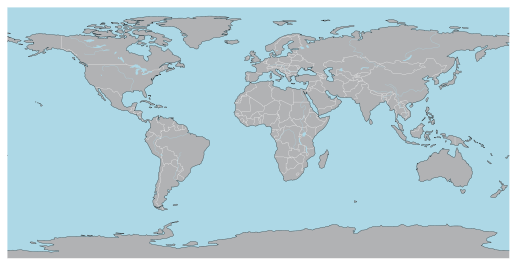

In [5]:

plt.close()

projection = ccrs.PlateCarree()

fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(1, 1, 1, projection=projection)

ax.add_feature(cartopy.feature.LAND, zorder=0, linewidth=.001, facecolor='#B1B2B4')
ax.add_feature(cartopy.feature.OCEAN, facecolor='lightblue')
ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.RIVERS, edgecolor='lightblue', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='lightblue', linewidth=.25)

ax.coastlines(color='black')
ax.outline_patch.set_edgecolor('white')

# set visible part of the world (default is plotted part)
ax.set_global()

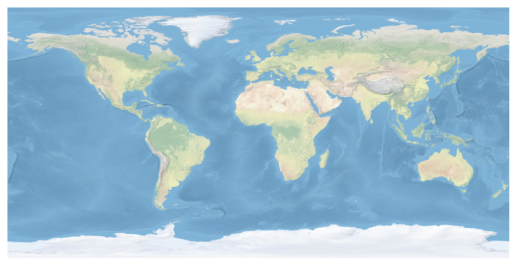

In [6]:
projection = ccrs.PlateCarree()

fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(1, 1, 1, projection=projection)

ax.stock_img()
ax.outline_patch.set_edgecolor('white')

# set visible part of the world (default is plotted part)
ax.set_global()

## Five color mapping

### Backtracking Algorithm

The idea is to assign colors one by one to different vertices, starting from the vertex 0. Before assigning a color, we check for safety by considering already assigned colors to the adjacent vertices. If we find a color assignment which is safe, we mark the color assignment as part of solution. If we do not a find color due to clashes then we backtrack and return false.

## Different views of the globe

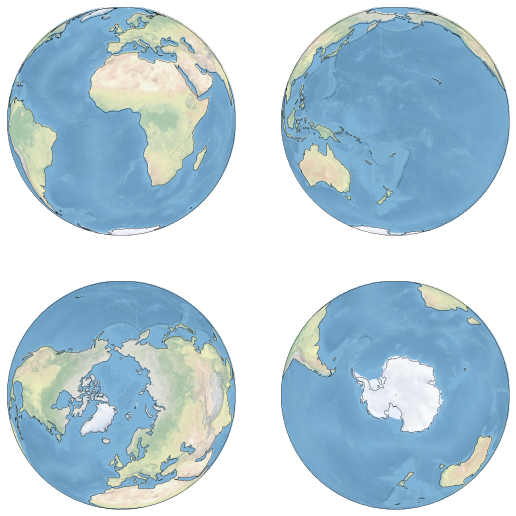

In [7]:
resolution='110m'
fig = plt.figure(figsize=(9,9))

ax = fig.add_subplot(2, 2, 1, projection=ccrs.Orthographic(central_longitude=0.0, central_latitude=0.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

ax = fig.add_subplot(2, 2, 2, projection=ccrs.Orthographic(central_longitude=180.0, central_latitude=0.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

ax = fig.add_subplot(2, 2, 3, projection=ccrs.Orthographic(central_longitude=0.0, central_latitude=90.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

ax = fig.add_subplot(2, 2, 4, projection=ccrs.Orthographic(central_longitude=0.0, central_latitude=-90.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

## Centered on Denmark

In [58]:
fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(1, 1, 1, projection=ccrs.Orthographic(central_longitude=9.5018, central_latitude=56.2639))
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

# set visible part of the world (default is plotted part)
ax.set_global()

##  Drop shadow

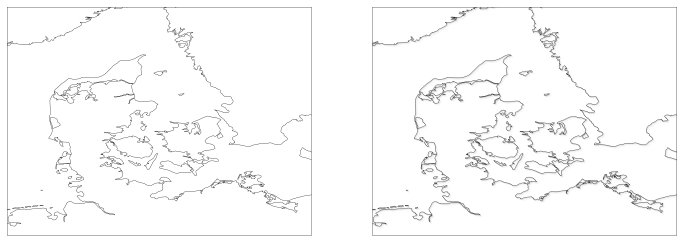

In [70]:
fig = plt.figure(figsize=(12,6))

#ax = fig.add_subplot(1, 1, 1, projection=ccrs.Orthographic(central_longitude=9.5018, central_latitude=56.2639))
ax = fig.add_subplot(1, 2, 1, projection=ccrs.PlateCarree())


ax.coastlines(color='black', resolution='10m')
#ax.add_feature(cartopy.feature.LAND, facecolor='white', edgecolor='black', path_effects=drop_shadow())
ax.set_extent([7, 15, 53, 59], crs= ccrs.PlateCarree())


ax = fig.add_subplot(1, 2, 2, projection=ccrs.PlateCarree())
ax.coastlines(color='black', resolution='10m', path_effects=drop_shadow())
#ax.add_feature(cartopy.feature.LAND, facecolor='white', edgecolor='black', path_effects=drop_shadow())
ax.set_extent([7, 15, 53, 59], crs= ccrs.PlateCarree())

## Show a geographical region

In [4]:
# map figure
projection = ccrs.PlateCarree()
#projection = ccrs.Orthographic(central_longitude=0.0, central_latitude=0.0)
resolution='10m'
#resolution='50m'
#resolution='110m'
fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(1, 1, 1, projection=projection)

# borders
#ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=.25)
# if you want border resolution other than 110m you need to use NaturalEarthFeature:
ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='black',
                                                   facecolor='none',
                                                   linewidth=.25,
                                                   scale=resolution))

ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'populated_places', color='red', edgecolor='red',
                                                   facecolor='red', scale=resolution), zorder=4)

# frame of map
ax.outline_patch.set_edgecolor('grey')

# coastline
ax.coastlines(color='black', resolution=resolution)

# set visible part of the world (default is plotted part)
ax.set_global()

ax.set_extent([80, 170, -45, 30])
#ax.set_extent([-20, 40, 30, 70])

//anaconda/envs/maps/lib/python3.4/site-packages/cartopy/io/__init__.py:264: DownloadWarning: Downloading: http://naciscdn.org/naturalearth/10m/cultural/ne_10m_populated_places.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


In [ ]:
# map figure
projection = ccrs.PlateCarree()
#projection = ccrs.Orthographic(central_longitude=0.0, central_latitude=0.0)
#resolution='10m'
#resolution='50m'
resolution='110m'
fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(1, 1, 1, projection=projection)

# borders
#ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=.25)
# if you want border resolution other than 110m you need to use NaturalEarthFeature:
ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='black',
                                                   facecolor='none',
                                                   linewidth=.25,
                                                   scale=resolution))

ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'populated_places', color='red', edgecolor='red',
                                                   facecolor='red', scale=resolution), zorder=4)

# frame of map
ax.outline_patch.set_edgecolor('grey')

# coastline
ax.coastlines(color='black', resolution=resolution)

# set visible part of the world (default is plotted part)
ax.set_global()

ax.set_extent([80, 170, -45, 30])
#ax.set_extent([-20, 40, 30, 70])

In [ ]:
import pandas as pd
import random 
random.seed(2)

# neigboring countries
# https://en.wikipedia.org/wiki/List_of_political_and_geographic_borders
countries_df = pd.read_table('countries.csv', sep=';').fillna('')

neighbors = dict()
for tup in countries_df.itertuples():
    lst = tup.Neighbors.split(' / ')
    if lst == ['']:
        lst = []
    neighbors[tup.Country] = lst

nr_countries = len(neighbors)
countries = sorted(neighbors)

# graph matrix of neighbors
graph = pd.DataFrame(dict((x, [0]*nr_countries) for x in countries), index=countries)
for c, n in neighbors.items():
    l = [x for x in n if x in countries]
    graph.loc[l, c] = 1
    
# map figure
#projection = ccrs.PlateCarree()
projection=ccrs.Orthographic(central_longitude=9.5018, central_latitude=56.2639)
#projection = ccrs.Orthographic(central_longitude=0.0, central_latitude=0.0)
#resolution='10m' 
resolution='50m'
#resolution='110m'
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1, 1, 1, projection=projection)

# country shape info
shpfilename = shpreader.natural_earth(resolution=resolution,
                                      category='cultural',
                                      name='admin_0_countries')
reader = shpreader.Reader(shpfilename)
records = reader.records()
info = dict((r.attributes['NAME_LONG'], r) for r in records)

# five map colors
#colors = ['pink', 'lightgreen', 'lightblue', 'orange', 'yellow']
colors = ['#EEEEEE', '#E8E8E8', '#DDDDDD', '#D8D8D8', '#CCCCCC']

# get order in which countries should be colored
stack = list()
while len(graph):
    assert graph.sum().min() < 5
    country = graph.sum().idxmin()
    stack.append(country)
    graph.drop(country, axis=0, inplace=True)
    graph.drop(country, axis=1, inplace=True)

def get_color(name, already_colored):
    lst = list()
    for n in neighbors[name]:
        if n in already_colored:
            lst.append(already_colored[n])    
    return random.choice([x for x in colors if x not in lst])

# color countries popped off stack
country_colors = dict()
for name in reversed(stack):
    country_colors[name] = get_color(name, country_colors)
    
for name, color in country_colors.items():
    try:
        country = info[name]
    except KeyError:        
        continue
    ax.add_geometries(country.geometry, ccrs.PlateCarree(), facecolor=color, label=name)

# shade blue of countries I have been to 
where_i_have_been = ['Denmark', 'Germany', 'Sweden', 'Norway', 'Finland', 'United Kingdom', 'Ireland',
                     'Poland', 'France', 'Austria', 'Switzerland', 'Spain', 'Portugal', 'Italy', 'Czech Republic', 
                     'Morocco', 'Turkey', 'Cuba', 'United States', 'Canada', 'Mexico', 'Japan']
for name in where_i_have_been:
    color='royalblue'
    country = info[name]
    ax.add_geometries(country.geometry, ccrs.PlateCarree(),
                      facecolor=color,
                      label=name, alpha=0.3)

    
# borders
#ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=.25)
# if you want border resolution other than 110m you need to use NaturalEarthFeature:
ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='black',
                                                   facecolor='none',
                                                   linewidth=.25,
                                                   scale=resolution))
# frame of map
ax.outline_patch.set_edgecolor('grey')

# coastline
ax.coastlines(color='black', resolution=resolution)

# set visible part of the world (default is plotted part)
ax.set_global()
#ax.set_extent([80, 170, -45, 30])
#ax.set_extent([-20, 40, 30, 70])